<a href="https://colab.research.google.com/github/shreya201/INSE6220_40208796/blob/main/Principal_Component_Analysis_and_Binary_classification_of_Rice_Types.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Principal Component Analysis and Binary classification of Rice Types**

**Install Pycaret**

In [3]:
!pip install pycaret==2.3.6


In [4]:
from tensorflow.python.client import device_lib
device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 12312073923455782259
 xla_global_id: -1]

**Import Libraries**

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
import pandas as pd
plt.rcParams['figure.figsize'] = (7,5)

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [27]:
print("Pandas version: ", pd.__version__)
print("Seaborn version: ", sns.__version__)

Pandas version:  1.3.5
Seaborn version:  0.11.2


**Dataset**

The “Rice Data Set” used for Principle Component Analysis (PCA) and classification models is obtained from Kaggle. The data set provided information
extracted from two rice varieties- “Gonen” and
“Jasmine”.
There are 11 attributes with 18185 entries and one column for classification. 
**Class 1 represents Jasmine and Class 0 represents Gonen.**


All attributes are numerical and they are listed bellow:

1.   id
2.   A = Area
3. MAL = MajorAxisLength
4. MNAL = MinorAxisLength
5. Ecc = Eccentricity
6. CA = ConvexArea
7. ED = EquivDiameter
8. ET = Extent
9. PM = Perimeter
10.RD = Roundness
11. AR = AspectRation
12. Class


https://www.kaggle.com/datasets/mssmartypants/rice-type-classification





In [6]:
#read cvs file into dataframe
df = pd.read_csv('https://raw.githubusercontent.com/shreya201/INSE6220_40208796/main/riceClassification.csv')
df.head(25)

,A,MAL,MNAL,Ecc,CA,ED,ET,PM,RD,AR,Class
0,4537,92.229316,64.012769,0.719916,4677,76.004525,0.657536,273.085,0.764510,1.440796,1
1,2872,74.691881,51.400454,0.725553,3015,60.471018,0.713009,208.317,0.831658,1.453137,1
2,3048,76.293164,52.043491,0.731211,3132,62.296341,0.759153,210.012,0.868434,1.465950,1
3,3073,77.033628,51.928487,0.738639,3157,62.551300,0.783529,210.657,0.870203,1.483456,1
4,3693,85.124785,56.374021,0.749282,3802,68.571668,0.769375,230.332,0.874743,1.510000,1
5,2990,77.417073,50.954344,0.752861,3080,61.700780,0.584898,216.930,0.798439,1.519342,1
6,3556,84.323564,55.413061,0.753762,3636,67.287739,0.750211,227.007,0.867148,1.521727,1
7,3788,86.952411,56.444769,0.760664,3866,69.448048,0.800676,235.476,0.858473,1.540487,1
8,2629,74.133114,48.074144,0.761228,2790,57.856260,0.640595,207.325,0.768594,1.542058,1
9,5719,106.721142,68.977700,0.763053,5819,85.332625,0.754983,281.839,0.904748,1.547183,1


In [7]:
len(df.index)

18185

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18185 entries, 0 to 18184
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   A       18185 non-null  int64  
 1   MAL     18185 non-null  float64
 2   MNAL    18185 non-null  float64
 3   Ecc     18185 non-null  float64
 4   CA      18185 non-null  int64  
 5   ED      18185 non-null  float64
 6   ET      18185 non-null  float64
 7   PM      18185 non-null  float64
 8   RD      18185 non-null  float64
 9   AR      18185 non-null  float64
 10  Class   18185 non-null  int64  
dtypes: float64(8), int64(3)
memory usage: 1.5 MB


In [9]:
print("Number of duplicated rows is: ", df.duplicated().sum())

Number of duplicated rows is:  0


In [10]:
print("Number of rows with NaNs is: ", df.isna().any(axis=1).sum())

Number of rows with NaNs is:  0


**Exploratory Data Analysis**

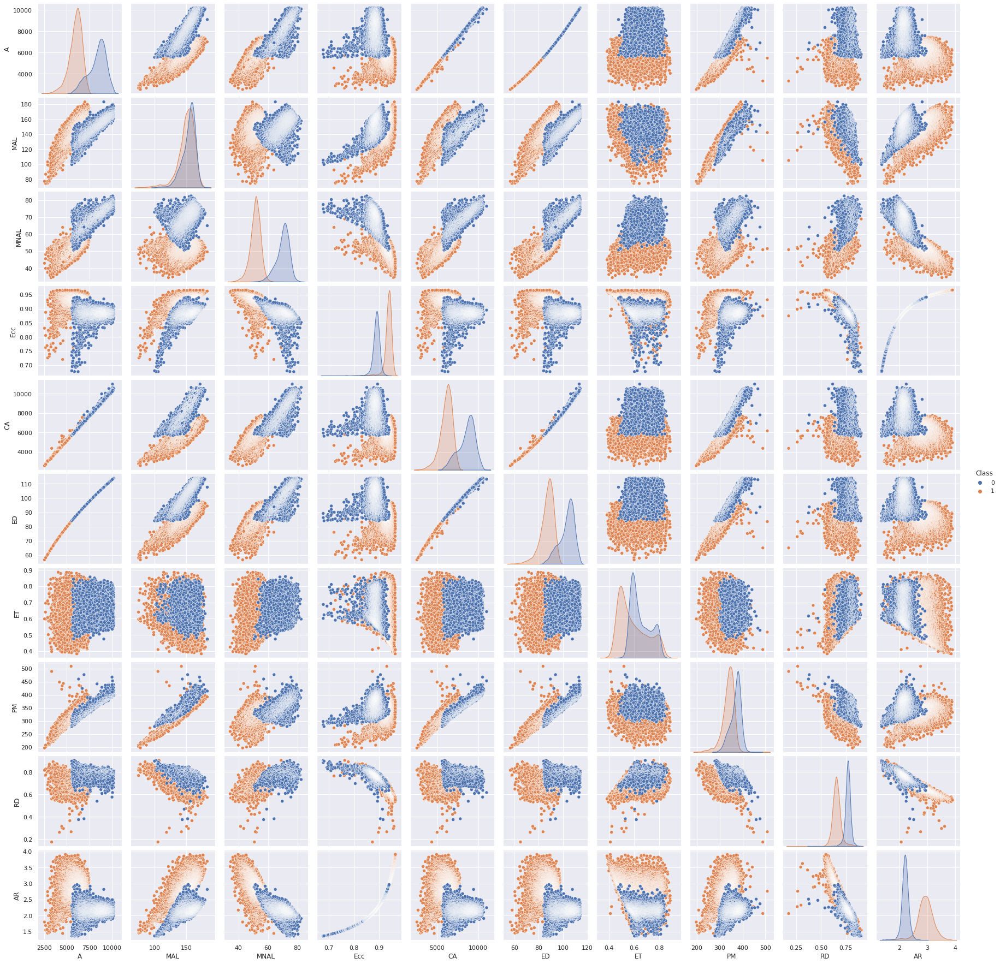

In [11]:
sns.pairplot(df, hue='Class')
plt.show()

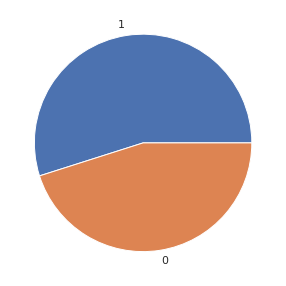

In [12]:
y =df['Class']
y.value_counts().plot(kind='pie')
plt.ylabel('')
plt.show()

**Data Matrix**

In [13]:
X = df.drop(columns=['Class'])
X.head(10)

,A,MAL,MNAL,Ecc,CA,ED,ET,PM,RD,AR
0,4537,92.229316,64.012769,0.719916,4677,76.004525,0.657536,273.085,0.764510,1.440796
1,2872,74.691881,51.400454,0.725553,3015,60.471018,0.713009,208.317,0.831658,1.453137
2,3048,76.293164,52.043491,0.731211,3132,62.296341,0.759153,210.012,0.868434,1.465950
3,3073,77.033628,51.928487,0.738639,3157,62.551300,0.783529,210.657,0.870203,1.483456
4,3693,85.124785,56.374021,0.749282,3802,68.571668,0.769375,230.332,0.874743,1.510000
5,2990,77.417073,50.954344,0.752861,3080,61.700780,0.584898,216.930,0.798439,1.519342
6,3556,84.323564,55.413061,0.753762,3636,67.287739,0.750211,227.007,0.867148,1.521727
7,3788,86.952411,56.444769,0.760664,3866,69.448048,0.800676,235.476,0.858473,1.540487
8,2629,74.133114,48.074144,0.761228,2790,57.856260,0.640595,207.325,0.768594,1.542058
9,5719,106.721142,68.977700,0.763053,5819,85.332625,0.754983,281.839,0.904748,1.547183


In [14]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
A,18185.0,7036.492989,1467.197150,2522.000000,5962.000000,6660.000000,8423.000000,10210.000000
MAL,18185.0,151.680754,12.376402,74.133114,145.675910,153.883750,160.056214,183.211434
MNAL,18185.0,59.807851,10.061653,34.409894,51.393151,55.724288,70.156593,82.550762
Ecc,18185.0,0.915406,0.030575,0.676647,0.891617,0.923259,0.941372,0.966774
CA,18185.0,7225.817872,1502.006571,2579.000000,6125.000000,6843.000000,8645.000000,11008.000000
ED,18185.0,94.132952,9.906250,56.666658,87.126656,92.085696,103.559146,114.016559
ET,18185.0,0.616653,0.104389,0.383239,0.538530,0.601194,0.695664,0.886573
PM,18185.0,351.606949,29.500620,197.015000,333.990000,353.088000,373.003000,508.511000
RD,18185.0,0.707998,0.067310,0.174590,0.650962,0.701941,0.769280,0.904748
AR,18185.0,2.599081,0.434836,1.358128,2.208527,2.602966,2.964101,3.911845


**Standardize the Data**

In [15]:
Xs = StandardScaler().fit_transform(X)
Xcols = X.columns
X = pd.DataFrame(Xs)
X.columns = Xcols
X.head(10)

,A,MAL,MNAL,Ecc,CA,ED,ET,PM,RD,AR
0,-1.703630,-4.803744,0.417927,-6.393938,-1.696989,-1.830049,0.391654,-2.661778,0.839588,-2.663800
1,-2.838478,-6.220789,-0.835611,-6.209583,-2.803539,-3.398143,0.923070,-4.857318,1.837215,-2.635418
2,-2.718519,-6.091404,-0.771700,-6.024520,-2.725641,-3.213879,1.365122,-4.799860,2.383587,-2.605950
3,-2.701479,-6.031573,-0.783130,-5.781578,-2.708996,-3.188141,1.598635,-4.777995,2.409877,-2.565690
4,-2.278893,-5.377799,-0.341288,-5.433479,-2.279559,-2.580390,1.463045,-4.111042,2.477331,-2.504645
5,-2.758051,-6.000590,-0.879950,-5.316410,-2.760262,-3.274000,-0.304201,-4.565350,1.343680,-2.483161
6,-2.372271,-5.442538,-0.436798,-5.286951,-2.390080,-2.710001,1.279457,-4.223754,2.364484,-2.477675
7,-2.214142,-5.230124,-0.334257,-5.061184,-2.236948,-2.491920,1.762905,-3.936668,2.235600,-2.434533
8,-3.004105,-6.265938,-1.166213,-5.042738,-2.953342,-3.662101,0.229356,-4.890945,0.900273,-2.430919
9,-0.897991,-3.632788,0.911391,-4.983052,-0.936651,-0.888385,1.325177,-2.365031,2.923116,-2.419132


In [16]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
A,18185.0,-8.076758e-16,1.000027,-3.077035,-0.732364,-0.256614,0.945030,2.163032
MAL,18185.0,-1.668888e-15,1.000027,-6.265938,-0.485198,0.178005,0.676747,2.547715
MNAL,18185.0,1.601768e-15,1.000027,-2.524303,-0.836337,-0.405865,1.028561,2.260418
Ecc,18185.0,-1.478761e-15,1.000027,-7.809152,-0.778086,0.256851,0.849263,1.680082
CA,18185.0,4.790718e-17,1.000027,-3.093825,-0.732918,-0.254878,0.944883,2.518156
ED,18185.0,-1.783182e-15,1.000027,-3.782190,-0.707280,-0.206669,0.951566,2.007233
ET,18185.0,-2.792255e-16,1.000027,-2.236051,-0.748401,-0.148095,0.756913,2.585776
PM,18185.0,-2.687173e-15,1.000027,-5.240439,-0.597189,0.050205,0.725295,5.318816
RD,18185.0,-1.673399e-15,1.000027,-7.924849,-0.847385,-0.089998,0.910465,2.923116
AR,18185.0,-5.107026e-16,1.000027,-2.853917,-0.898188,0.008934,0.839464,3.019065


**Observations and variables**

In [17]:
observations = list(df.index)
variables = list(df.columns)

**Box and Whisker Plots**

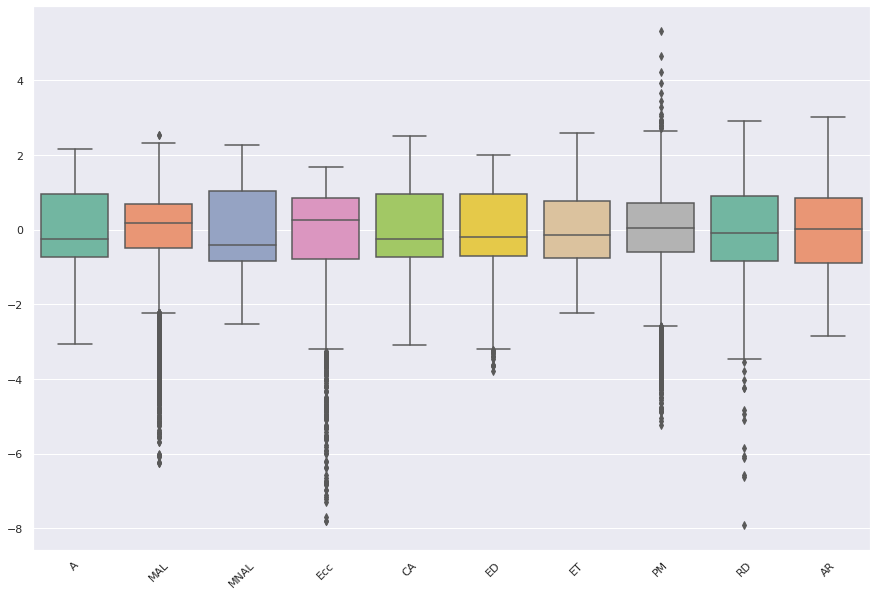

In [18]:
ax = plt.figure(figsize=(15,10))
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

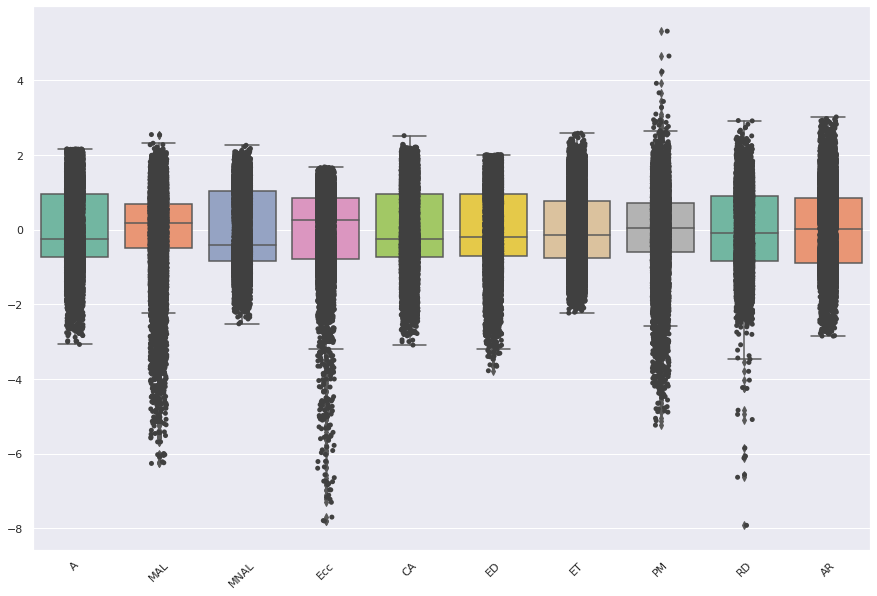

In [19]:
# Use swarmplot() or stripplot to show the datapoints on top of the boxes:
#plt. figure()

ax = plt.figure(figsize=(15,10))    
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax = sns.stripplot(data=X, color=".25") 
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

**Correlation Matrix**

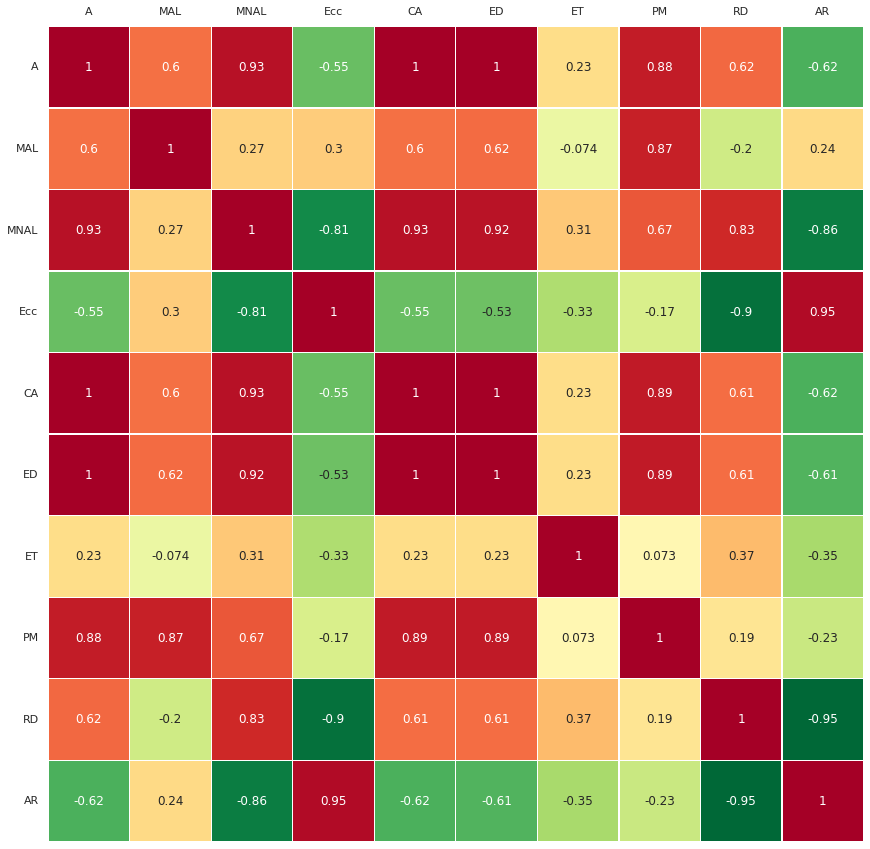

In [20]:
fig1,ax1 = plt.subplots(figsize=(15, 15))
ax = sns.heatmap(X.corr(), cmap='RdYlGn_r', linewidths=0.3, annot=True, cbar=False, square=True)
plt.yticks(rotation=0)
ax.tick_params(labelbottom=False,labeltop=True)
ax.set_xticklabels(ax.get_xticklabels(),rotation=0);

#X.corr().style.background_gradient(cmap='coolwarm').set_precision(2)
#sns.clustermap(X.corr(), annot=True, fmt='.2f')

# **Principal Component Analysis (PCA)**

Text(0, 0.5, '$Z_2$')

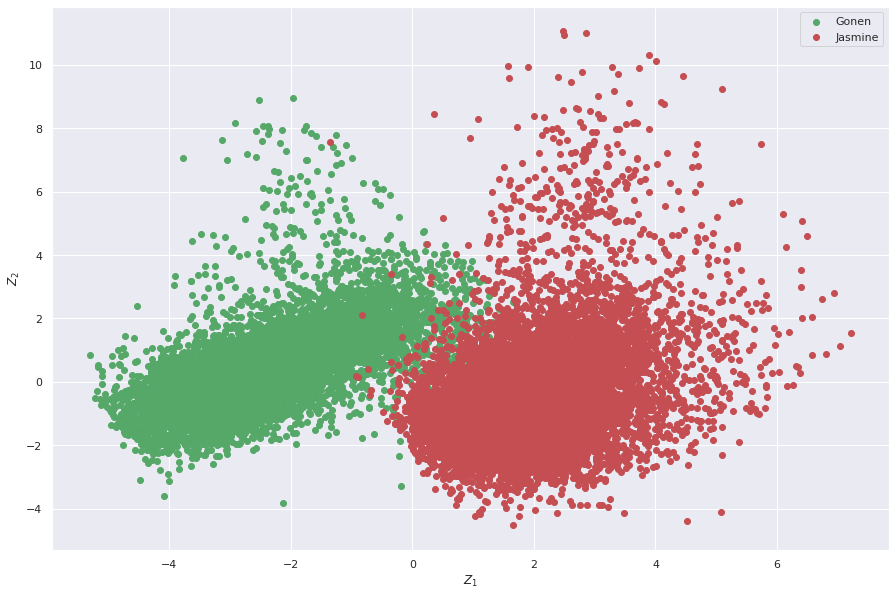

In [21]:
pca = PCA()
Z = pca.fit_transform(X)

# (Jasmine)->1,  (Gonen)->0

idx_Gonen= np.where(y == 0)
idx_Jasmine = np.where(y == 1)


plt. figure(figsize=(15,10))
plt.scatter(Z[idx_Gonen,0], Z[idx_Gonen,1], c='g', label='Gonen')
plt.scatter(Z[idx_Jasmine,0], Z[idx_Jasmine,1], c='r', label='Jasmine')


plt.legend()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')

**Eigenvectors**

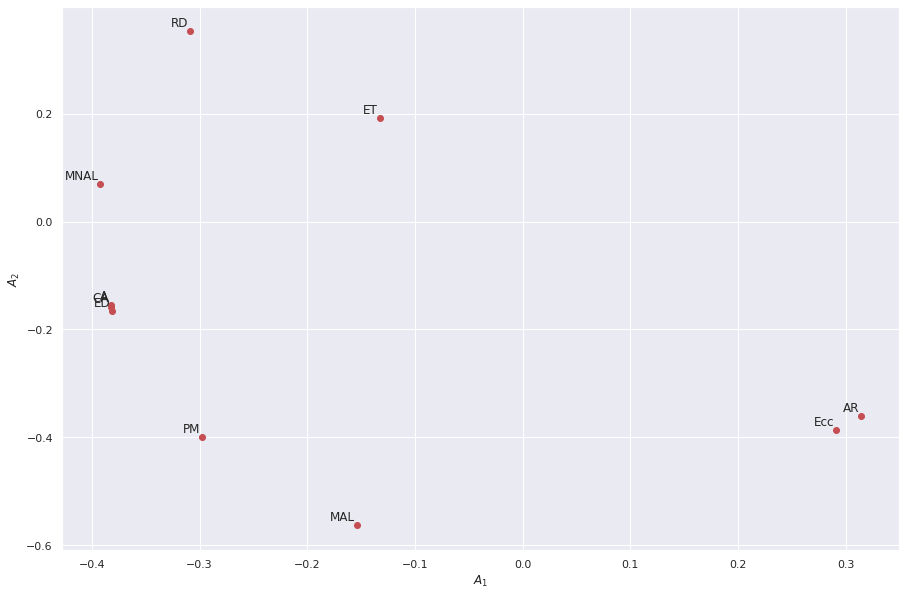

In [22]:
A = pca.components_.T 
plt. figure(figsize=(15,10))

plt.scatter(A[:,0],A[:,1],c='r')
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables, A[:, 0], A[:, 1]):
  plt.annotate(label, xy=(x, y), xytext=(-2, 2), textcoords='offset points', ha='right', va='bottom')

/usr/local/lib/python3.7/dist-packages/matplotlib/collections.py:885: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


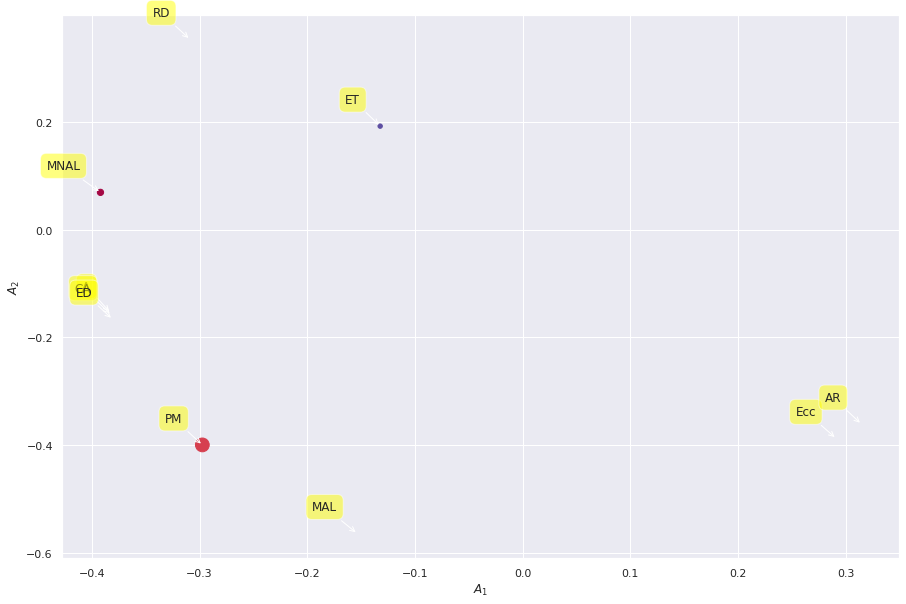

In [23]:
plt. figure(figsize=(15,10))
plt.scatter(A[:, 0],A[:, 1], marker='o', c=A[:, 2], s=A[:, 3]*500, cmap=plt.get_cmap('Spectral'))
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables,A[:, 0],A[:, 1]):
  plt.annotate(label,xy=(x, y), xytext=(-20, 20),
      textcoords='offset points', ha='right', va='bottom',
      bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
      arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))

**Scree plot**

array([6.38246162e+00, 2.60627856e+00, 8.38749613e-01, 1.14902472e-01,
       4.48562667e-02, 8.59683693e-03, 2.57994436e-03, 1.54518501e-03,
       4.01613916e-04, 1.77825801e-04])

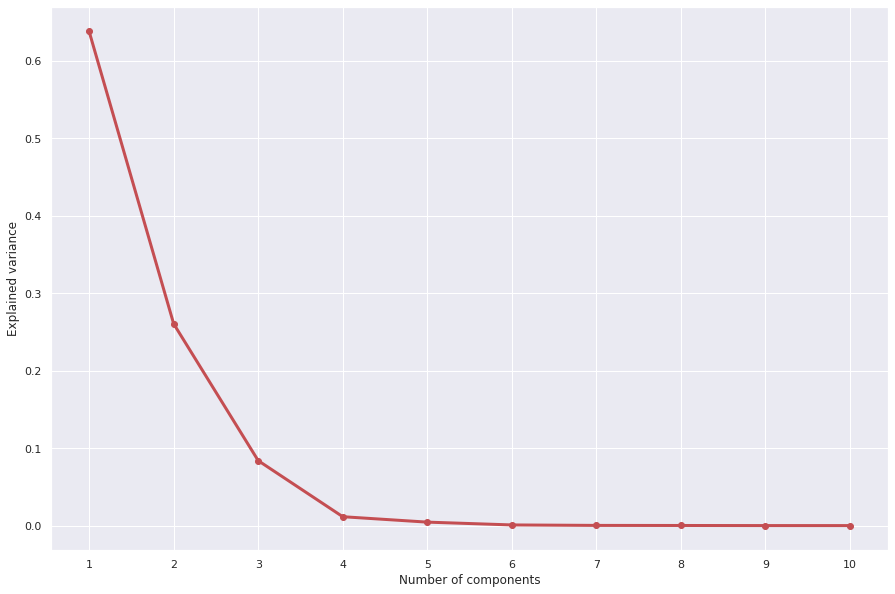

In [24]:
#Eigenvalues
Lambda = pca.explained_variance_ 

#Scree plot
x = np.arange(len(Lambda)) + 1
plt. figure(figsize=(15,10))
plt.plot(x,Lambda/sum(Lambda), 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
Lambda

**Explained Variance**

Text(0, 0.5, 'Cumulative explained variance')

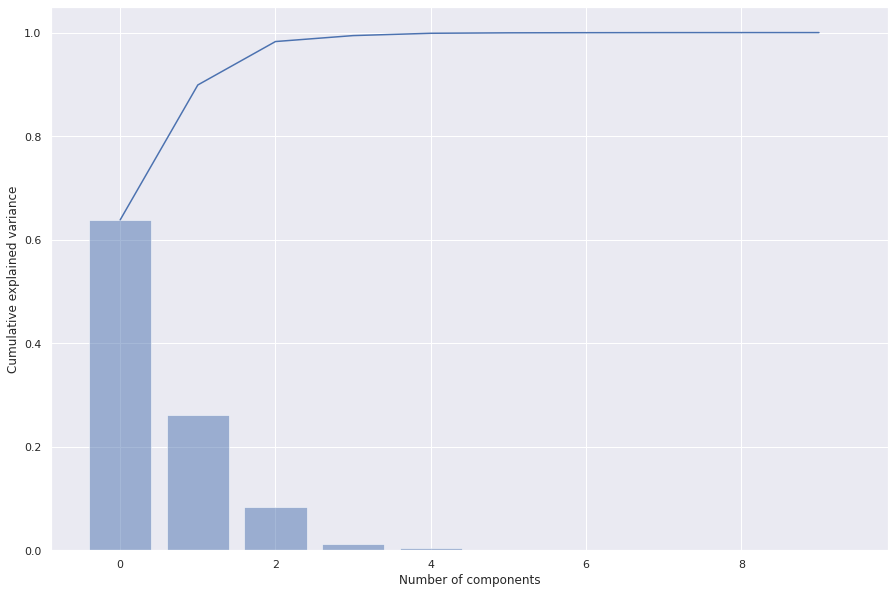

In [25]:
ell = pca.explained_variance_ratio_
ind = np.arange(len(ell))
plt. figure(figsize=(15,10))
plt.bar(ind, ell, align='center', alpha=0.5)
plt.plot(np.cumsum(ell))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

**Biplot**

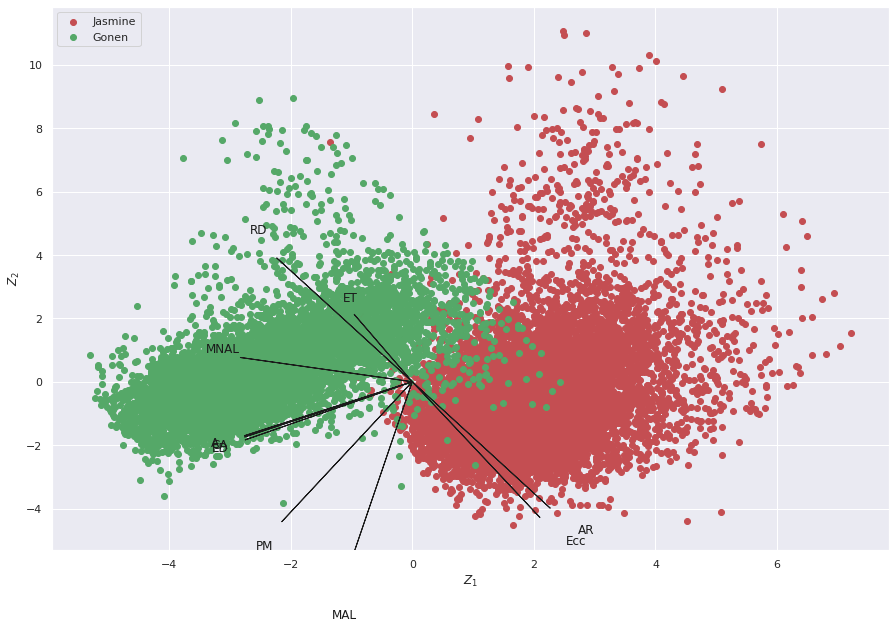

In [26]:
# 0,1 denote PC1 and PC2; change values for other PCs
A1 = A[:,0] 
A2 = A[:,1]
Z1 = Z[:,0] 
Z2 = Z[:,1]

plt. figure(figsize=(15,10))
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')
for i in range(len(A1)):
# arrows project features as vectors onto PC axes
  plt.arrow(0, 0, A1[i]*max(Z1), A2[i]*max(Z2), color='k', width=0.0005, head_width=0.0025)
  plt.text(A1[i]*max(Z1)*1.2, A2[i]*max(Z2)*1.2,variables[i], color='k')

plt.scatter(Z[idx_Jasmine,0], Z[idx_Jasmine,1], c='r', label='Jasmine')
plt.scatter(Z[idx_Gonen,0], Z[idx_Gonen,1], c='g', label='Gonen')
#plt.scatter(Z[idx_Canadian,0], Z[idx_Canadian,1], c='b', label='Canadian')
plt.legend(loc='upper left')

# **Using PCA Library**

In [27]:
!pip install pca

  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9675 sha256=dc21622b654fa0903d9a0dfdbb1464b9d1805f94d565abea1ac006200fb0f93e
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e3c13e3c02
Successfully built wget


In [28]:
from pca import pca
# Initialize and keep all PCs
model = pca()
# Fit transform
out = model.fit_transform(X)

[pca] >Processing dataframe..
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [10] columns of the input data.
[pca] >Fitting using PCA..
[pca] >Computing loadings and PCs..
[pca] >Computing explained variance..
[pca] >Number of components is [3] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [10] columns of the input dataframe.
[pca] >Fitting using PCA..
[pca] >Computing loadings and PCs..
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[3]
[pca] >Outlier detection using SPE/DmodX with n_std=[2]


**Principal Components**

In [29]:
out['PC']

,PC1,PC2,PC3
0,0.354083,8.442447,-1.355742
1,2.854920,11.013745,-0.931820
2,2.482805,11.056600,-0.515969
3,2.493232,10.949386,-0.246925
4,1.581389,9.952350,-0.305457
...,...,...,...
18180,2.294296,-0.298537,-0.786845
18181,-0.224148,-2.334744,0.724407
18182,1.488253,-0.662739,-0.197156
18183,2.203078,-0.804845,-0.773643


**Scatter plot**

(<Figure size 1440x1080 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fdb3de9e7d0>)

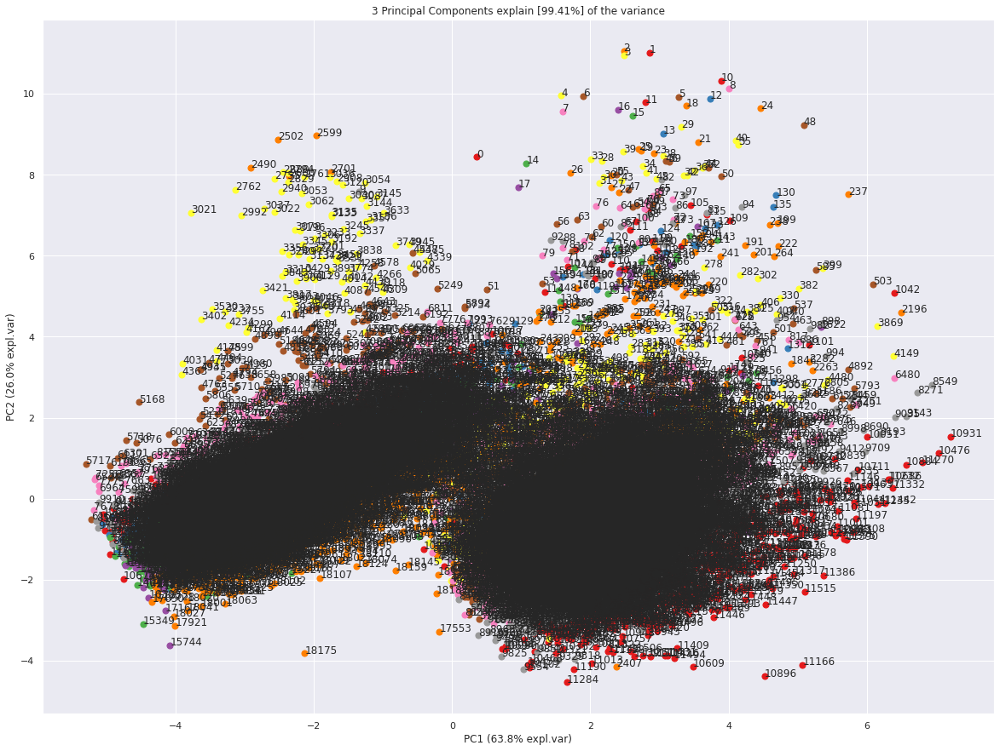

In [30]:
model.scatter(label=True, legend=False)

**Eigenvectors**

In [31]:
A = out['loadings'].T

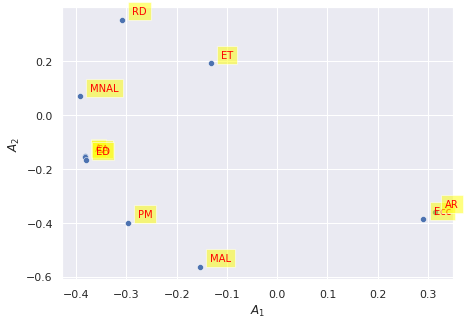

In [32]:
sns.scatterplot(data=A, x="PC1", y="PC2")
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for i in range(A.shape[0]):
 plt.text(x=A.PC1[i]+0.02,y=A.PC2[i]+0.02, s=variables[i],
          fontdict=dict(color='red',size=10),
          bbox=dict(facecolor='yellow',alpha=0.5))

**Scree Plot**

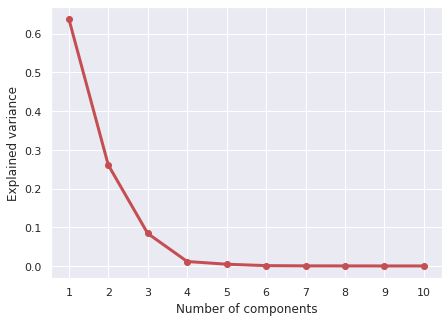

In [33]:
VR = out['variance_ratio']
x = np.arange(len(VR)) + 1
plt.plot(x, VR, 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance') 
plt.show()

**Explained Variance Plot**

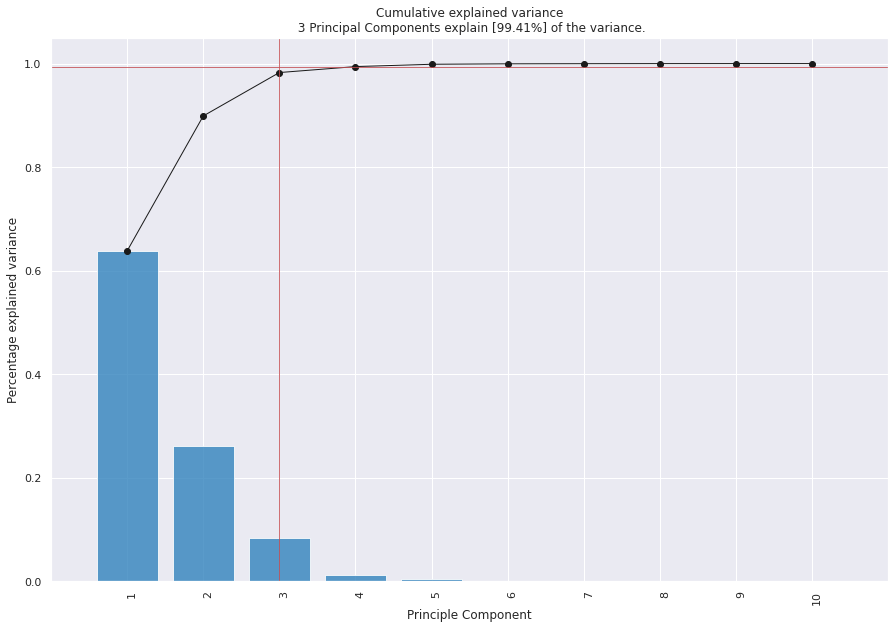

<Figure size 504x360 with 0 Axes>

In [34]:
model.plot();

**Biplot**

[pca] >Plot PC1 vs PC2 with loadings.


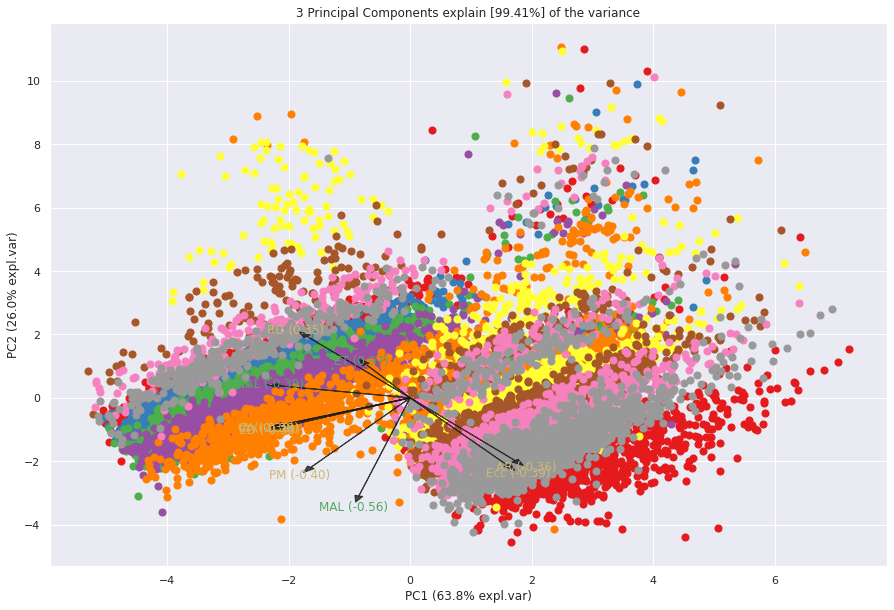

(<Figure size 1080x720 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fdb313a5950>)

In [35]:
model.biplot(label=False, legend=False, color_arrow='k')

[pca] >Plot PC1 vs PC2 vs PC3 with loadings.


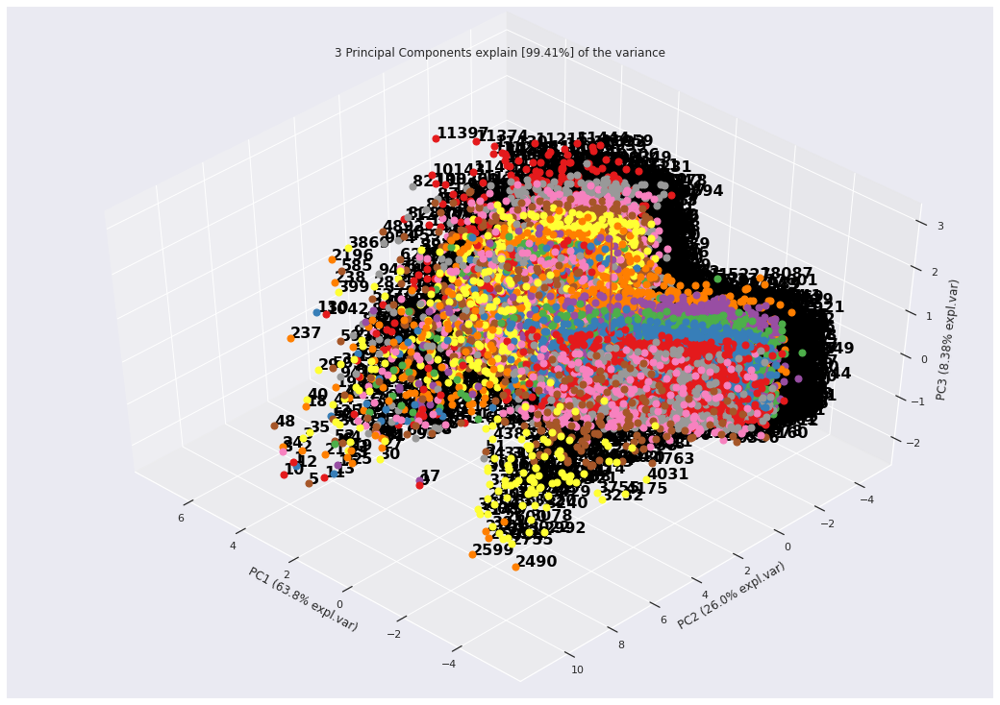

(<Figure size 1080x720 with 2 Axes>,
 <mpl_toolkits.mplot3d.axes3d.Axes3D at 0x7f59d1073310>)

In [59]:
model.biplot3d(legend=False)

# Classification using Pycaret

In [36]:
#Run the below code in your notebook to check the installed version
from pycaret.utils import version
version()

'2.3.6'

In [37]:
#For Google Colab only
from pycaret.utils import enable_colab 
enable_colab()

Colab mode enabled.


In [38]:
data = df.sample(frac=0.9, random_state=786)
data_unseen = df.drop(data.index)
#dr = df.drop(columns=['id'])

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (16366, 11)
Unseen Data For Predictions: (1819, 11)


In [39]:
from pycaret.classification import *
clf = setup(data=data, target='Class', train_size=0.7, session_id=123)

,Description,Value
0,session_id,123
1,Target,Class
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(16366, 11)"
5,Missing Values,False
6,Numeric Features,10
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


**Comparing All Models**

In [40]:
#show the best model and their statistics
best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
et,Extra Trees Classifier,0.9898,0.9988,0.9922,0.9892,0.9907,0.9794,0.9794,0.656
ada,Ada Boost Classifier,0.9893,0.9988,0.9917,0.9887,0.9902,0.9783,0.9783,0.616
rf,Random Forest Classifier,0.9892,0.9986,0.9922,0.9881,0.9901,0.9781,0.9782,1.371
gbc,Gradient Boosting Classifier,0.9891,0.9990,0.9920,0.9881,0.9900,0.9780,0.9780,2.314
qda,Quadratic Discriminant Analysis,0.9888,0.9986,0.9927,0.9870,0.9898,0.9774,0.9775,0.023
lightgbm,Light Gradient Boosting Machine,0.9887,0.9992,0.9912,0.9882,0.9897,0.9773,0.9773,0.212
lr,Logistic Regression,0.9882,0.9988,0.9922,0.9864,0.9893,0.9762,0.9762,0.401
knn,K Neighbors Classifier,0.9879,0.9960,0.9935,0.9845,0.9890,0.9755,0.9756,0.149
lda,Linear Discriminant Analysis,0.9855,0.9989,0.9971,0.9769,0.9869,0.9707,0.9710,0.030
nb,Naive Bayes,0.9843,0.9990,0.9968,0.9750,0.9858,0.9682,0.9685,0.023


In [41]:
best_model

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='auto',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False)

 Create a Model

**Extra Trees Classifier**

In [42]:
et = create_model('et')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9860,0.9981,0.9888,0.9857,0.9873,0.9718,0.9718
1,0.9965,0.9988,0.9952,0.9984,0.9968,0.9930,0.9930
2,0.9948,0.9996,0.9984,0.9921,0.9952,0.9894,0.9895
3,0.9878,0.9993,0.9920,0.9857,0.9889,0.9753,0.9754
4,0.9878,0.9995,0.9872,0.9904,0.9888,0.9754,0.9754
5,0.9904,0.9985,0.9936,0.9889,0.9912,0.9806,0.9806
6,0.9886,0.9994,0.9904,0.9889,0.9896,0.9771,0.9771
7,0.9878,0.9986,0.9904,0.9873,0.9888,0.9753,0.9753
8,0.9895,0.9982,0.9952,0.9858,0.9905,0.9788,0.9789
9,0.9886,0.9975,0.9904,0.9888,0.9896,0.9771,0.9771


**Tune the model**

In [43]:
tuned_et=tune_model(et)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9843,0.9985,0.9920,0.9795,0.9857,0.9683,0.9684
1,0.9948,0.9993,0.9968,0.9936,0.9952,0.9894,0.9894
2,0.9930,0.9996,0.9968,0.9905,0.9936,0.9859,0.9859
3,0.9878,0.9990,0.9936,0.9842,0.9889,0.9753,0.9754
4,0.9895,0.9992,0.9904,0.9904,0.9904,0.9789,0.9789
5,0.9921,0.9981,0.9952,0.9905,0.9928,0.9841,0.9842
6,0.9895,0.9993,0.9936,0.9873,0.9905,0.9788,0.9789
7,0.9869,0.9992,0.9888,0.9872,0.9880,0.9736,0.9736
8,0.9878,0.9984,0.9920,0.9857,0.9889,0.9753,0.9753
9,0.9860,0.9985,0.9888,0.9857,0.9872,0.9718,0.9718


**Evaluate Extra Trees Classifier**


In [44]:
evaluate_model(tuned_et)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Create model with K-nearest neighbour**

In [47]:
knn = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9825,0.9939,0.9904,0.9780,0.9842,0.9647,0.9648
1,0.9965,0.9989,0.9968,0.9968,0.9968,0.9930,0.9930
2,0.9930,0.9979,0.9968,0.9905,0.9936,0.9859,0.9859
3,0.9869,0.9938,0.9952,0.9811,0.9881,0.9735,0.9737
4,0.9808,0.9958,0.9872,0.9779,0.9825,0.9612,0.9613
5,0.9895,0.9968,0.9984,0.9827,0.9905,0.9788,0.9790
6,0.9895,0.9968,0.9952,0.9858,0.9905,0.9788,0.9789
7,0.9869,0.9970,0.9904,0.9857,0.9880,0.9736,0.9736
8,0.9869,0.9942,0.9920,0.9842,0.9881,0.9735,0.9736
9,0.9860,0.9944,0.9920,0.9826,0.9873,0.9718,0.9718


**Tune model with K-nearest neighbour**

In [49]:
tuned_knn = tune_model(knn)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9852,0.9959,0.9904,0.9826,0.9865,0.9700,0.9701
1,0.9956,0.9989,0.9968,0.9952,0.9960,0.9912,0.9912
2,0.9948,0.9989,0.9984,0.9921,0.9952,0.9894,0.9895
3,0.9852,0.9956,0.9920,0.9811,0.9865,0.9700,0.9701
4,0.9843,0.9966,0.9888,0.9826,0.9857,0.9683,0.9683
5,0.9921,0.9977,0.9984,0.9874,0.9929,0.9841,0.9842
6,0.9886,0.9976,0.9920,0.9873,0.9897,0.9771,0.9771
7,0.9878,0.9970,0.9920,0.9857,0.9889,0.9753,0.9753
8,0.9878,0.9952,0.9920,0.9857,0.9889,0.9753,0.9753
9,0.9895,0.9951,0.9936,0.9873,0.9904,0.9788,0.9789


**Evaluate model with K-nearest neighbour**

In [50]:
evaluate_model(tuned_knn)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Create model with Random Forest**

In [51]:
rf=create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9852,0.9961,0.9888,0.9841,0.9865,0.9701,0.9701
1,0.9948,0.9980,0.9936,0.9968,0.9952,0.9894,0.9894
2,0.9930,0.9997,0.9968,0.9905,0.9936,0.9859,0.9859
3,0.9852,0.9992,0.9904,0.9826,0.9865,0.9700,0.9701
4,0.9878,0.9995,0.9872,0.9904,0.9888,0.9754,0.9754
5,0.9913,0.9984,0.9952,0.9889,0.9921,0.9824,0.9824
6,0.9878,0.9995,0.9920,0.9857,0.9889,0.9753,0.9753
7,0.9878,0.9987,0.9936,0.9842,0.9889,0.9753,0.9754
8,0.9886,0.9975,0.9920,0.9873,0.9896,0.9771,0.9771
9,0.9904,0.9989,0.9920,0.9904,0.9912,0.9806,0.9806


**Tune Random Forest Model**

In [52]:
tuned_rf=tune_model(rf)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9843,0.9987,0.9872,0.9841,0.9857,0.9683,0.9683
1,0.9939,0.9989,0.9968,0.9921,0.9944,0.9877,0.9877
2,0.9939,0.9995,0.9968,0.9921,0.9944,0.9877,0.9877
3,0.9843,0.9989,0.9888,0.9826,0.9857,0.9683,0.9683
4,0.9878,0.9991,0.9872,0.9904,0.9888,0.9754,0.9754
5,0.9913,0.9975,0.9952,0.9889,0.9921,0.9824,0.9824
6,0.9895,0.9993,0.9936,0.9873,0.9905,0.9788,0.9789
7,0.9886,0.9992,0.9904,0.9888,0.9896,0.9771,0.9771
8,0.9886,0.9977,0.9920,0.9873,0.9896,0.9771,0.9771
9,0.9860,0.9985,0.9888,0.9857,0.9872,0.9718,0.9718


**Evaluate Random Forest Model**

In [53]:
evaluate_model(tuned_rf)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [55]:
!pip install statsmodels --upgrade

# **Classification + PCA**

In [56]:
clf_pca = setup(data=data, target='Class', train_size=0.7, session_id=123, normalize = True, pca = True, pca_components = 3)

,Description,Value
0,session_id,123
1,Target,Class
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(16366, 11)"
5,Missing Values,False
6,Numeric Features,10
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


# **Comparing Models**

In [57]:
#show the best model and their statistics
best_model_pca = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
et,Extra Trees Classifier,0.9895,0.9987,0.9925,0.9884,0.9904,0.9789,0.9789,0.646
knn,K Neighbors Classifier,0.9890,0.9946,0.9922,0.9878,0.9900,0.9778,0.9778,0.207
rf,Random Forest Classifier,0.9889,0.9979,0.9923,0.9875,0.9899,0.9776,0.9776,1.067
ada,Ada Boost Classifier,0.9885,0.9988,0.9922,0.9868,0.9895,0.9767,0.9768,0.364
lightgbm,Light Gradient Boosting Machine,0.9881,0.9988,0.9903,0.9881,0.9892,0.9760,0.9761,0.164
gbc,Gradient Boosting Classifier,0.9880,0.9986,0.9906,0.9876,0.9891,0.9759,0.9759,1.025
svm,SVM - Linear Kernel,0.9867,0.0000,0.9892,0.9866,0.9879,0.9732,0.9732,0.045
qda,Quadratic Discriminant Analysis,0.9867,0.9989,0.9957,0.9804,0.9880,0.9732,0.9733,0.021
lr,Logistic Regression,0.9866,0.9984,0.9911,0.9845,0.9878,0.9729,0.9729,0.621
nb,Naive Bayes,0.9853,0.9987,0.9966,0.9770,0.9867,0.9703,0.9706,0.062


# **Best model with PCA**

In [58]:
best_model_pca

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='auto',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False)

# **Tune Best Model**

In [59]:
# Tune hyperparameters with scikit-learn (default)
tuned_best_model_pca = tune_model(best_model_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9860,0.9979,0.9936,0.9811,0.9873,0.9718,0.9719
1,0.9930,0.9994,0.9984,0.9889,0.9937,0.9859,0.9860
2,0.9930,0.9992,0.9984,0.9889,0.9937,0.9859,0.9860
3,0.9869,0.9990,0.9920,0.9842,0.9881,0.9736,0.9736
4,0.9834,0.9994,0.9856,0.9841,0.9849,0.9665,0.9665
5,0.9921,0.9986,0.9968,0.9889,0.9929,0.9841,0.9842
6,0.9886,0.9995,0.9936,0.9858,0.9897,0.9771,0.9771
7,0.9825,0.9990,0.9888,0.9794,0.9841,0.9647,0.9648
8,0.9878,0.9984,0.9920,0.9857,0.9889,0.9753,0.9753
9,0.9852,0.9973,0.9920,0.9810,0.9865,0.9700,0.9701


# **Evaluate Best Model**

In [77]:
evaluate_model(tuned_best_model_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [60]:
!pip install shap

     |████████████████████████████████| 564 kB 4.2 MB/s 


In [61]:
import shap

# **Create Extra Tress Classifier Model**

> Indented block



In [64]:
et_pca = create_model('et')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9852,0.9976,0.9888,0.9841,0.9865,0.9701,0.9701
1,0.9956,0.9984,0.9968,0.9952,0.9960,0.9912,0.9912
2,0.9921,0.9998,0.9952,0.9905,0.9928,0.9841,0.9842
3,0.9887,0.9995,0.9936,0.9858,0.9897,0.9771,0.9771
4,0.9887,0.9995,0.9936,0.9858,0.9897,0.9771,0.9771
5,0.9913,0.9981,0.9952,0.9889,0.9921,0.9824,0.9824
6,0.9886,0.9995,0.9888,0.9904,0.9896,0.9771,0.9771
7,0.9878,0.9994,0.9888,0.9888,0.9888,0.9753,0.9753
8,0.9886,0.9972,0.9936,0.9857,0.9897,0.9771,0.9771
9,0.9886,0.9978,0.9904,0.9888,0.9896,0.9771,0.9771


# **Tune Model**

In [65]:
tuned_et_pca = tune_model(et_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9860,0.9979,0.9936,0.9811,0.9873,0.9718,0.9719
1,0.9930,0.9994,0.9984,0.9889,0.9937,0.9859,0.9860
2,0.9930,0.9992,0.9984,0.9889,0.9937,0.9859,0.9860
3,0.9869,0.9990,0.9920,0.9842,0.9881,0.9736,0.9736
4,0.9834,0.9994,0.9856,0.9841,0.9849,0.9665,0.9665
5,0.9921,0.9986,0.9968,0.9889,0.9929,0.9841,0.9842
6,0.9886,0.9995,0.9936,0.9858,0.9897,0.9771,0.9771
7,0.9825,0.9990,0.9888,0.9794,0.9841,0.9647,0.9648
8,0.9878,0.9984,0.9920,0.9857,0.9889,0.9753,0.9753
9,0.9852,0.9973,0.9920,0.9810,0.9865,0.9700,0.9701


# **Evaluate Model**

In [80]:
evaluate_model(tuned_et_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

# **Create K-nearest neighbour Model**

In [83]:
knn_pca = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9834,0.9895,0.9872,0.9825,0.9849,0.9665,0.9665
1,0.9948,0.9981,0.9968,0.9936,0.9952,0.9894,0.9894
2,0.9948,0.9969,0.9968,0.9936,0.9952,0.9894,0.9894
3,0.9860,0.9958,0.9920,0.9826,0.9873,0.9718,0.9719
4,0.9913,0.9953,0.9920,0.9920,0.9920,0.9824,0.9824
5,0.9887,0.9951,0.9920,0.9873,0.9897,0.9771,0.9771
6,0.9886,0.9954,0.9904,0.9889,0.9896,0.9771,0.9771
7,0.9869,0.9962,0.9888,0.9872,0.9880,0.9736,0.9736
8,0.9886,0.9923,0.9952,0.9842,0.9897,0.9771,0.9771
9,0.9869,0.9916,0.9904,0.9857,0.9880,0.9736,0.9736


# **Tune Model**

In [84]:
tuned_knn_pca = tune_model(knn_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9834,0.9963,0.9888,0.9810,0.9849,0.9665,0.9666
1,0.9965,0.9990,0.9984,0.9952,0.9968,0.9930,0.9930
2,0.9939,0.9988,0.9968,0.9921,0.9944,0.9877,0.9877
3,0.9878,0.9995,0.9936,0.9842,0.9889,0.9753,0.9754
4,0.9904,0.9994,0.9904,0.9920,0.9912,0.9806,0.9806
5,0.9921,0.9984,0.9952,0.9905,0.9928,0.9841,0.9842
6,0.9904,0.9995,0.9920,0.9904,0.9912,0.9806,0.9806
7,0.9869,0.9987,0.9888,0.9872,0.9880,0.9736,0.9736
8,0.9878,0.9972,0.9920,0.9857,0.9889,0.9753,0.9753
9,0.9869,0.9971,0.9904,0.9857,0.9880,0.9736,0.9736


# **Evaluate Model KNN**

In [85]:
evaluate_model(tuned_knn_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

# **Create Model Random Forest**

In [86]:
rf_pca = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9817,0.9947,0.9841,0.9825,0.9833,0.9630,0.9630
1,0.9974,0.9988,0.9984,0.9968,0.9976,0.9947,0.9947
2,0.9921,0.9985,0.9968,0.9889,0.9929,0.9841,0.9842
3,0.9887,0.9982,0.9952,0.9842,0.9897,0.9771,0.9772
4,0.9869,0.9992,0.9888,0.9873,0.9880,0.9736,0.9736
5,0.9904,0.9990,0.9952,0.9873,0.9913,0.9806,0.9807
6,0.9886,0.9993,0.9904,0.9889,0.9896,0.9771,0.9771
7,0.9860,0.9990,0.9872,0.9872,0.9872,0.9718,0.9718
8,0.9895,0.9965,0.9952,0.9858,0.9905,0.9788,0.9789
9,0.9878,0.9960,0.9920,0.9857,0.9889,0.9753,0.9753


# **Tune model**

In [87]:
tuned_rf_pca = tune_model(rf_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9852,0.9962,0.9888,0.9841,0.9865,0.9701,0.9701
1,0.9948,0.9984,0.9952,0.9952,0.9952,0.9894,0.9894
2,0.9948,0.9996,0.9968,0.9936,0.9952,0.9894,0.9894
3,0.9904,0.9978,0.9952,0.9873,0.9913,0.9806,0.9807
4,0.9895,0.9995,0.9888,0.9920,0.9904,0.9789,0.9789
5,0.9887,0.9969,0.9904,0.9889,0.9896,0.9771,0.9771
6,0.9869,0.9977,0.9904,0.9857,0.9881,0.9735,0.9736
7,0.9860,0.9972,0.9888,0.9857,0.9872,0.9718,0.9718
8,0.9886,0.9967,0.9920,0.9873,0.9896,0.9771,0.9771
9,0.9895,0.9959,0.9904,0.9904,0.9904,0.9789,0.9789


# **Evaluate Model**

In [88]:
evaluate_model(tuned_rf_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

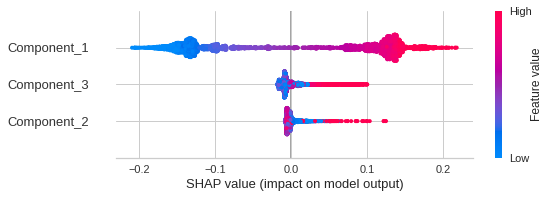

In [66]:
interpret_model(tuned_et_pca, plot='summary')


In [67]:
interpret_model(tuned_et_pca, plot='reason', observation=32)

In [ ]:
interpret_model(tuned_et_pca, plot='reason')